# Module 2: Finding What Matters - Filtering & Edge Detection

## Welcome to Module 2!

In Module 1, we learned to see an image as a grid of pixels and perform basic manipulations on it as a whole. But how does a computer start to understand the *content* of an image? How does it find objects, lines, and textures?

**Our Story for this Module:** We will explore the fundamental concept of **convolution**. We'll discover how a small matrix called a **kernel** can slide over an image to modify pixels based on their neighbors. This simple operation is the key to powerful techniques like blurring, sharpening, and, most importantly, **edge detection**—the first step towards identifying the structure of objects in an image.

### **Setup: Importing Libraries**

We'll continue using OpenCV, NumPy, and Matplotlib as our primary tools.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

# Helper function to display images in a consistent way
def display_image(title, image, is_bgr=True):
    # Convert BGR to RGB for correct display in Matplotlib
    if is_bgr:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = image
    plt.imshow(image_rgb, cmap='gray' if len(image.shape) == 2 else None)
    plt.title(title)
    plt.axis('off')
    plt.show()

print("Libraries imported successfully!")

Libraries imported successfully!


---

## **Part 1: The Convolution Operation**

Convolution is a mathematical operation where we take a small matrix called a **kernel** and slide it over our image. At each location, we multiply the kernel's values with the corresponding pixel values in the image patch underneath it and sum them up to get a new pixel value for our output image.

This process allows us to create a new image where each pixel is a function of its local neighborhood. By changing the numbers in the kernel, we can achieve different effects.

### **1.1 Image Blurring (Averaging)**

The simplest filter is an **averaging filter**, also known as a box blur. The kernel is a grid of ones, divided by the total number of elements. This replaces each pixel with the average value of its neighbors, resulting in a smoothing or blurring effect.

Let's create a 5x5 averaging kernel and apply it to an image using `cv2.filter2D()`.

Original image shape: (427, 640, 3)
--- 5x5 Averaging Kernel ---
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


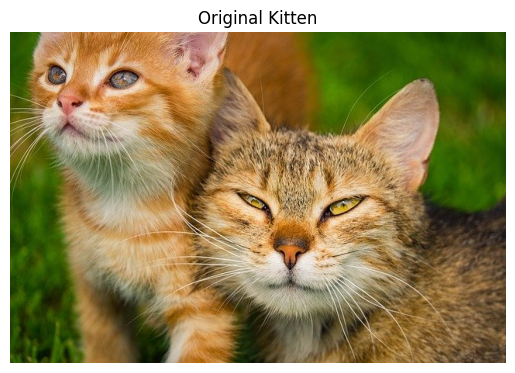

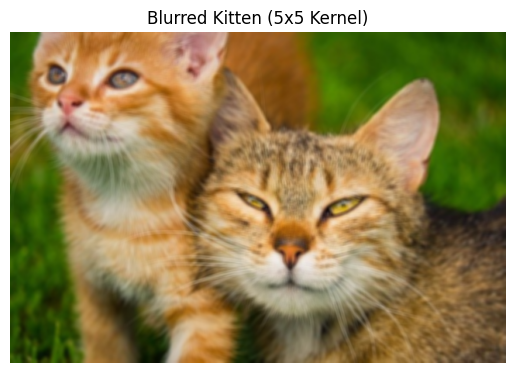

In [6]:
image_path = '../assets/kitten.jpg'
image = cv2.imread(image_path)

print(f"Original image shape: {image.shape}")

# Define a 5x5 averaging kernel
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size**2)

print("--- 5x5 Averaging Kernel ---")
print(kernel)

# Apply the convolution
blurred_image = cv2.filter2D(image, ddepth=-1, kernel=kernel)

display_image("Original Kitten", image)
display_image("Blurred Kitten (5x5 Kernel)", blurred_image)

OpenCV provides convenient built-in functions for common filters like `cv2.blur()` (box blur) and `cv2.GaussianBlur()`. A Gaussian blur is similar to a box blur, but it uses a kernel where the center pixels have more weight, resulting in a smoother, more natural-looking blur.

Applied 11x11 Box Blur.
Applied 11x11 Gaussian Blur.


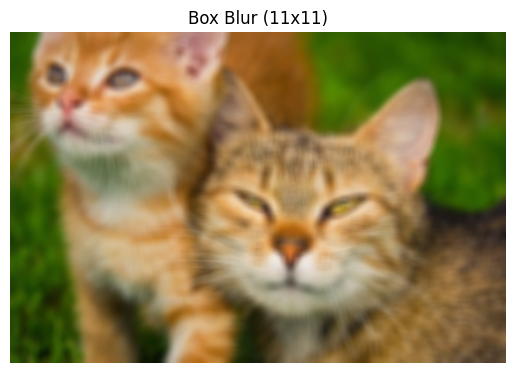

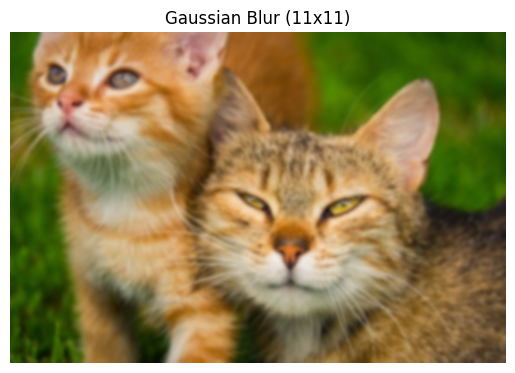

In [7]:
# Apply a larger box blur (11x11)
box_blur = cv2.blur(image, (11, 11))
print("Applied 11x11 Box Blur.")

# Apply a larger Gaussian blur (11x11)
gaussian_blur = cv2.GaussianBlur(image, (11, 11), 0)
print("Applied 11x11 Gaussian Blur.")

display_image("Box Blur (11x11)", box_blur)
display_image("Gaussian Blur (11x11)", gaussian_blur)

### ⭐ You Try It! - Experiment with Blurring

In the cell below, apply a **very strong** Gaussian blur to the `image`. Try a kernel size of `(35, 35)`. What do you observe about the result?

Applied a very strong 35x35 Gaussian Blur.


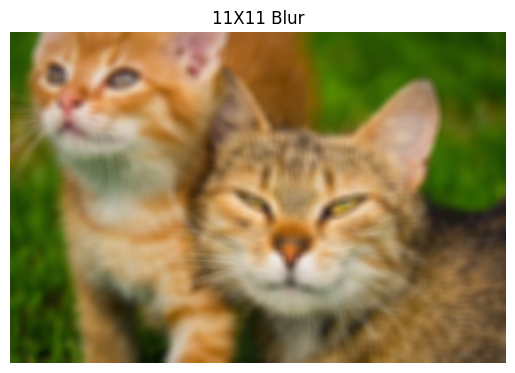

Applied a very strong 35x35 Gaussian Blur.


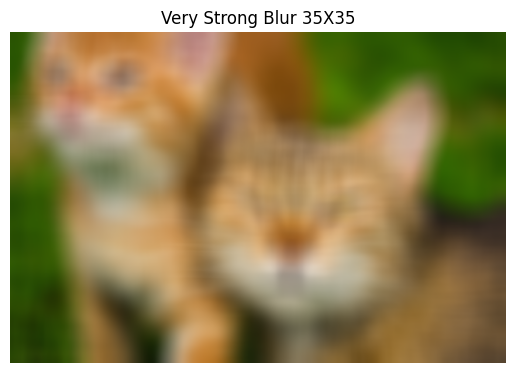

In [12]:
# YOUR CODE HERE: Apply a 35x35 Gaussian blur to the 'image'
strong_blur = cv2.blur(image, (11, 11)) 

print("Applied a very strong 35x35 Gaussian Blur.")
display_image("11X11 Blur", strong_blur)


# YOUR CODE HERE: Apply a 35x35 Gaussian blur to the 'image'
strong_blur = cv2.blur(image, (35, 35)) 

print("Applied a very strong 35x35 Gaussian Blur.")
display_image("Very Strong Blur 35X35", strong_blur)

<details>
<summary>Click here for the solution</summary>

```python
strong_blur = cv2.GaussianBlur(image, (35, 35), 0)
print("Applied a very strong 35x35 Gaussian Blur.")
display_image("Very Strong Blur", strong_blur)
# You'll observe that the image becomes very smooth, and almost all fine details are lost.
```
</details>

### **1.2 Image Sharpening**

If blurring is achieved by averaging, sharpening is achieved by accentuating differences between a pixel and its neighbors. We can design a kernel that does this by subtracting the values of neighboring pixels from an amplified center pixel.

--- Sharpening Kernel ---
[[-1 -1 -1]
 [-1  9 -1]
 [-1 -1 -1]]


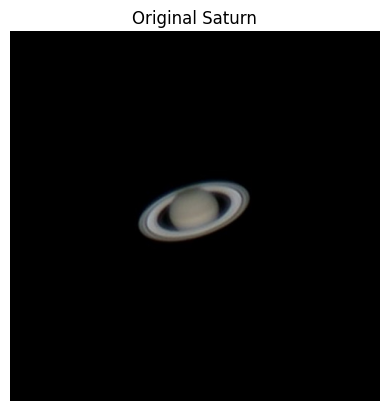

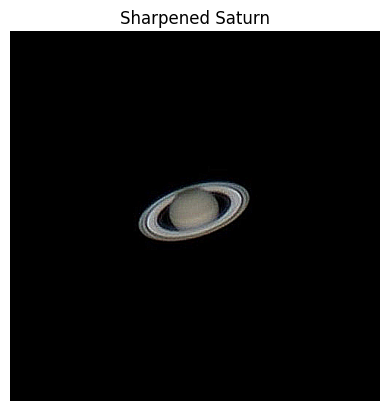

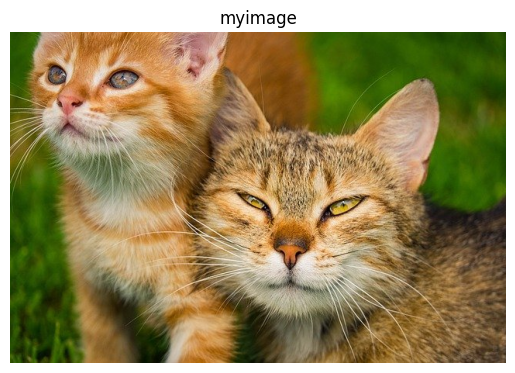

Original image shape: (427, 640, 3)


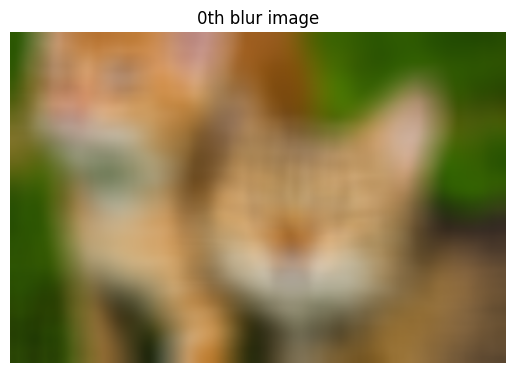

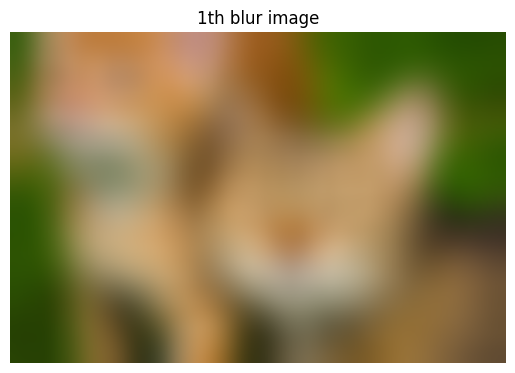

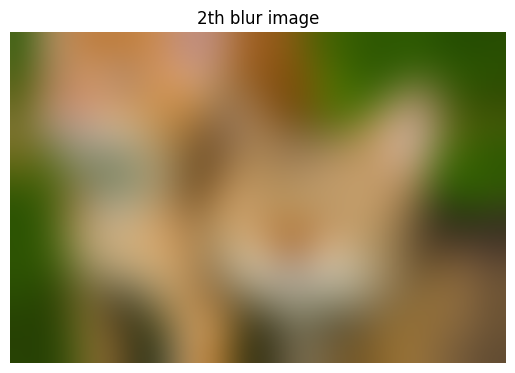

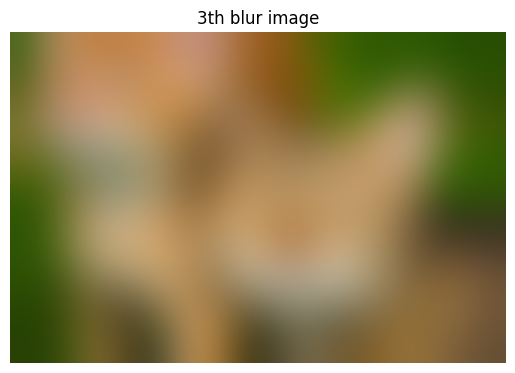

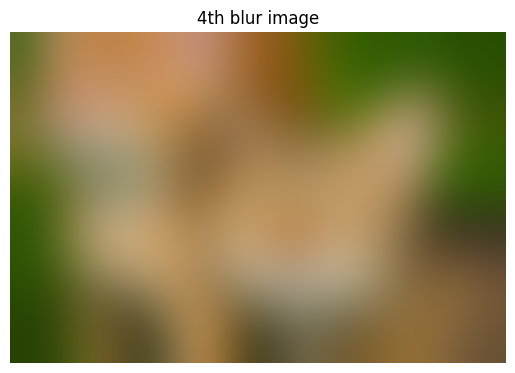

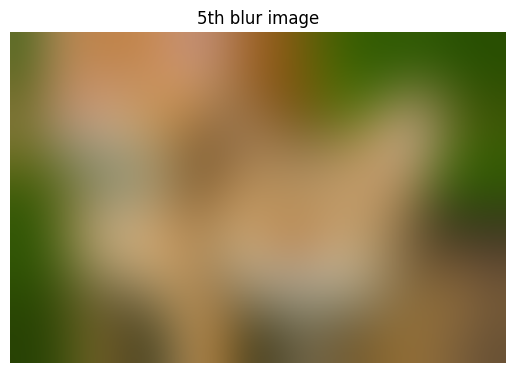

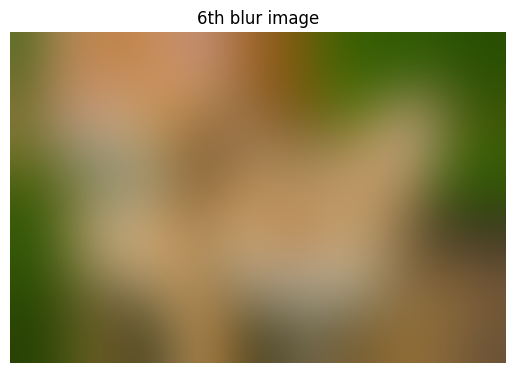

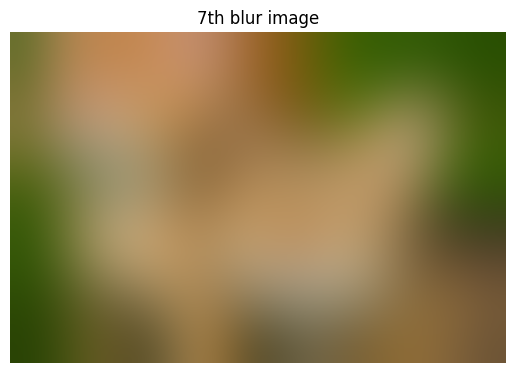

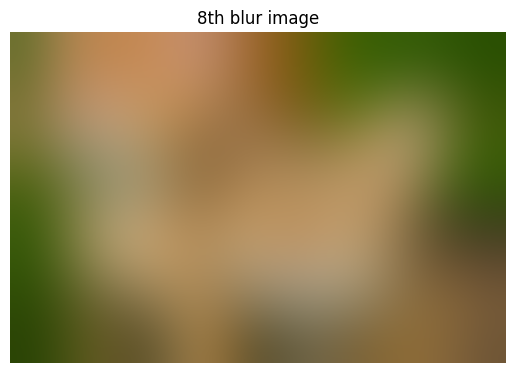

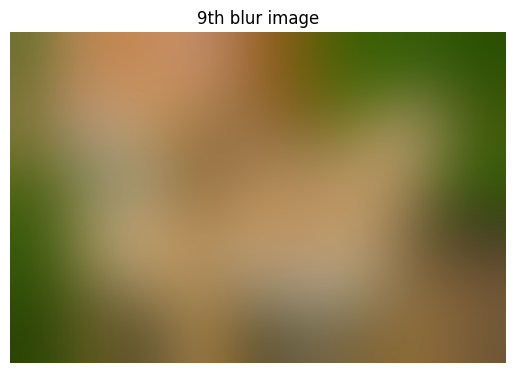

In [45]:
saturn_path = '../assets/saturn.jpg'
saturn_img = cv2.imread(saturn_path)

# Define a sharpening kernel
# The center pixel is amplified, and the neighbors are subtracted.
sharpen_kernel = np.array([[-1, -1, -1],
                             [-1,  9, -1],
                             [-1, -1, -1]])

print("--- Sharpening Kernel ---")
print(sharpen_kernel)

# Apply the sharpening kernel via convolution
sharpened_saturn = cv2.filter2D(saturn_img, ddepth=-1, kernel=sharpen_kernel)

display_image("Original Saturn", saturn_img)
display_image("Sharpened Saturn", sharpened_saturn)

image_path = '../assets/kitten.jpg'
image = cv2.imread(image_path)

display_image('myimage',image)

print(f"Original image shape: {image.shape}")

for i in range(10):
        strong_blur = cv2.blur(image, (50, 50))
        display_image(f"{i}th blur image", strong_blur)
        image = strong_blur


---

## **Part 2: Edge Detection**

An **edge** is a location in an image where there is a sharp change in intensity. Detecting these edges is the first step toward understanding the structure and boundaries of objects. Blurring smooths an image (low-pass filtering), while edge detection highlights areas of high frequency (high-pass filtering).

The most famous and widely used edge detection algorithm is **Canny Edge Detection**.

### **2.1 Canny Edge Detection**

The Canny algorithm is a multi-stage process that is very effective at finding clean, thin edges.

**The Key Idea (Hysteresis Thresholding):** Canny uses two thresholds:
- A **high threshold** to identify "sure edges" (pixels with a very strong intensity gradient).
- A **low threshold** to identify "weak but potential edges."

The algorithm keeps any weak edge pixel only if it is connected to a sure edge. This helps to eliminate noise while preserving the true, continuous edges of objects.

Converted image to grayscale for edge detection.


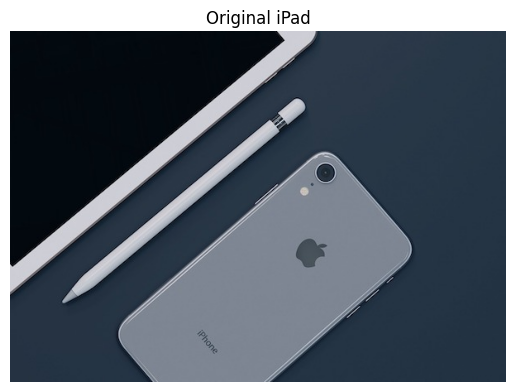

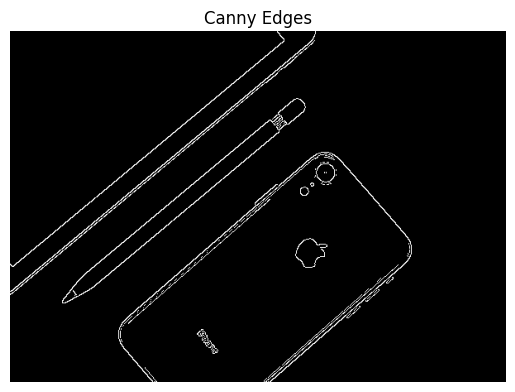

In [14]:
ipad_path = '../assets/ipad-pro-12-9-2017.jpg'
ipad_img = cv2.imread(ipad_path)

# It's best practice to convert to grayscale for edge detection
gray_ipad = cv2.cvtColor(ipad_img, cv2.COLOR_BGR2GRAY)
print("Converted image to grayscale for edge detection.")

# Apply Canny Edge Detection
low_threshold = 100
high_threshold = 200
edges = cv2.Canny(gray_ipad, low_threshold, high_threshold)

display_image("Original iPad", ipad_img)
display_image("Canny Edges", edges, is_bgr=False)

In [16]:
%pip install imageio

  Using cached imageio-2.37.2-py3-none-any.whl.metadata (9.7 kB)
Using cached imageio-2.37.2-py3-none-any.whl (317 kB)
Note: you may need to restart the kernel to use updated packages.


Creating animation... this might take a moment.
Saved edge_detection_animation.gif


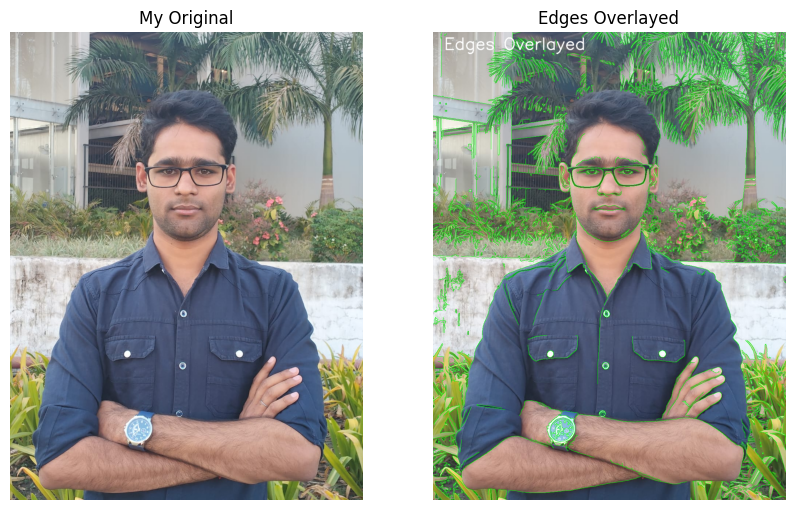

In [19]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imageio # Used to create the GIF

# --- 1. Load Original Image ---
building_path = '../assets/me.jpg' # Make sure this path is correct
building_img = cv2.cvtColor(cv2.imread(building_path), cv2.COLOR_BGR2RGB)

# --- 2. Prepare Frames for Animation ---
frames = []
font = cv2.FONT_HERSHEY_SIMPLEX

# Frame 1: Original Image
frame1 = building_img.copy()
cv2.putText(frame1, 'Original', (30, 50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
frames.append(frame1)

# Frame 2: Grayscale
# Canny edge detection requires a grayscale image
gray = cv2.cvtColor(building_img, cv2.COLOR_RGB2GRAY)
frame2 = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB) # Convert back to RGB for the GIF
cv2.putText(frame2, 'Grayscale', (30, 50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
frames.append(frame2)

# Frame 3: Blurred
# We blur the image to reduce noise before edge detection
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
frame3 = cv2.cvtColor(blurred, cv2.COLOR_GRAY2RGB) # Convert back to RGB
cv2.putText(frame3, 'Blurred (Noise Reduction)', (30, 50), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
frames.append(frame3)

# Frame 4: Canny Edges
# This is the actual edge detection step
# We use two thresholds: threshold1 and threshold2
edges = cv2.Canny(blurred, 50, 150)
frame4 = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB) # Convert back to RGB
cv2.putText(frame4, 'Canny Edges', (30, 50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
frames.append(frame4)

# Frame 5: "Fill Colors" (Overlay Edges on Original)
# This shows the original image with the detected edges drawn on top in green
frame5 = building_img.copy()
frame5[edges != 0] = [0, 255, 0] # Set edge pixels to bright green
cv2.putText(frame5, 'Edges Overlayed', (30, 50), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
frames.append(frame5)


# --- 3. Save the Animation ---
print("Creating animation... this might take a moment.")
imageio.mimsave('edge_detection_animation.gif', frames, fps=1)
print("Saved edge_detection_animation.gif")


# --- 4. Show the Final "Filled" Frame Statically ---
# This shows the last frame ("fill the colors") using matplotlib
plt.figure(figsize=(10, 8))

# Original
plt.subplot(1, 2, 1)
plt.imshow(building_img)
plt.title("My Original")
plt.axis('off')

# Edges Overlayed
plt.subplot(1, 2, 2)
plt.imshow(frame5)
plt.title("Edges Overlayed")
plt.axis('off')

plt.show()

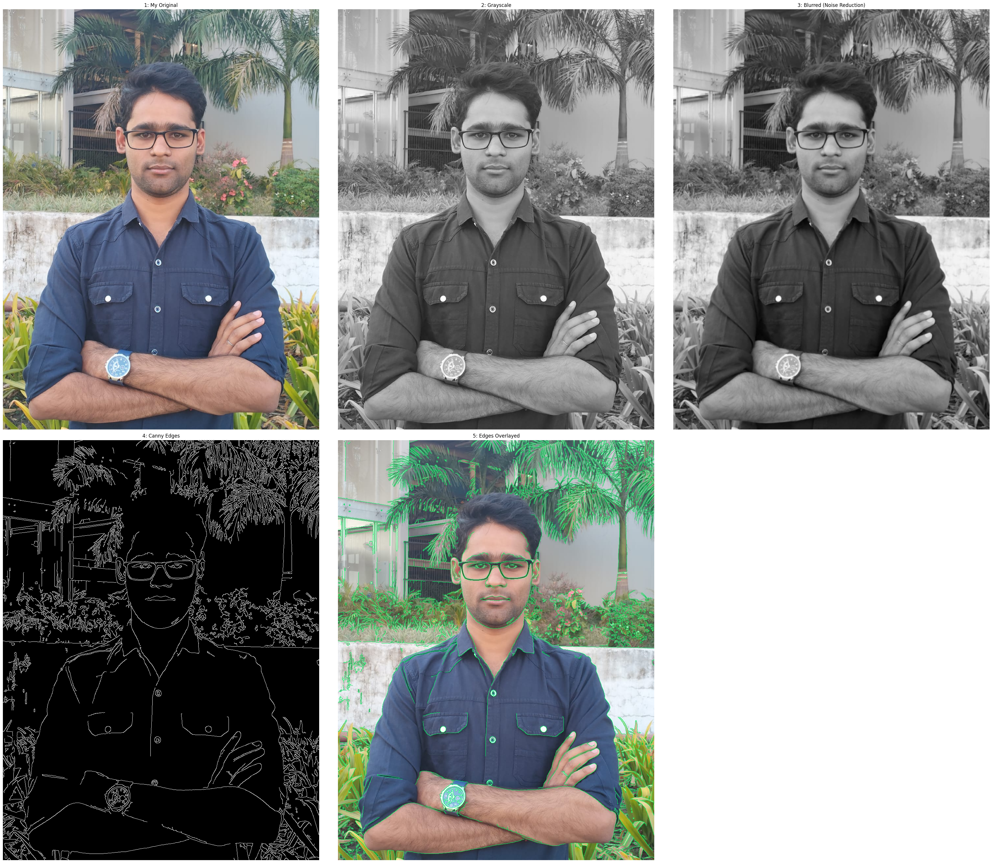

In [30]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Load Original Image ---
building_path = '../assets/me.jpg' # Make sure this path is correct
building_img = cv2.cvtColor(cv2.imread(building_path), cv2.COLOR_BGR2RGB)

# --- 2. Process the Image ---

# Grayscale
gray = cv2.cvtColor(building_img, cv2.COLOR_RGB2GRAY)

# Blurred
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Canny Edges
edges = cv2.Canny(blurred, 50, 150)

# Overlay Edges on Original
overlay_img = building_img.copy()
overlay_img[edges != 0] = [0, 255, 100] # Set edge pixels to bright green

# --- 3. Create and Show Subplots ---

# Create a figure with a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(35, 30))

# Plot 1: Original Image
axes[0, 0].imshow(building_img)
axes[0, 0].set_title("1: My Original")
axes[0, 0].axis('off')

# Plot 2: Grayscale Image
axes[0, 1].imshow(gray, cmap='gray')
axes[0, 1].set_title("2: Grayscale")
axes[0, 1].axis('off')

# Plot 3: Blurred Image
axes[0, 2].imshow(blurred, cmap='gray')
axes[0, 2].set_title("3: Blurred (Noise Reduction)")
axes[0, 2].axis('off')

# Plot 4: Canny Edges
axes[1, 0].imshow(edges, cmap='gray')
axes[1, 0].set_title("4: Canny Edges")
axes[1, 0].axis('off')

# Plot 5: Edges Overlayed ("Filled")
axes[1, 1].imshow(overlay_img)
axes[1, 1].set_title("5: Edges Overlayed")
axes[1, 1].axis('off')

# Hide the last empty subplot (index [1, 2])
axes[1, 2].axis('off')

# Adjust layout to prevent titles from overlapping
plt.tight_layout()

# Display the single figure with all subplots
plt.show()

### ⭐ You Try It! - Tune the Canny Thresholds

The choice of `low_threshold` and `high_threshold` greatly affects the output. In the cell below, experiment with different values for these thresholds.

1.  Try very **low thresholds** (e.g., `low=10`, `high=30`). What happens?
2.  Try very **high thresholds** (e.g., `low=200`, `high=240`). What happens?

Generated edges with low thresholds (10, 30).
Generated edges with high thresholds (200, 240).


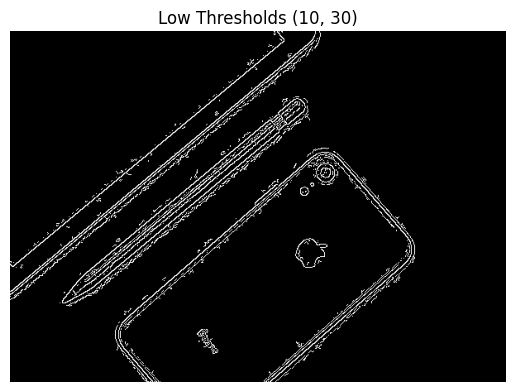

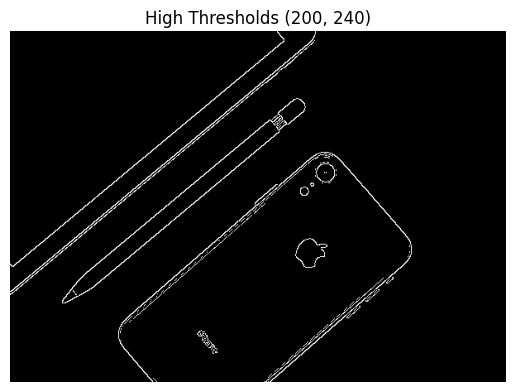

In [23]:
# YOUR CODE HERE: Experiment with low thresholds
low_thresh_val = 10
high_thresh_val = 30
low_threshold_edges = cv2.Canny(gray_ipad, low_thresh_val, high_thresh_val)
print(f"Generated edges with low thresholds ({low_thresh_val}, {high_thresh_val}).")

# YOUR CODE HERE: Experiment with high thresholds
low_thresh_val_high = 200
high_thresh_val_high = 240
high_threshold_edges = cv2.Canny(gray_ipad, low_thresh_val_high, high_thresh_val_high)
print(f"Generated edges with high thresholds ({low_thresh_val_high}, {high_thresh_val_high}).")


# Display the results
display_image(f"Low Thresholds ({low_thresh_val}, {high_thresh_val})", low_threshold_edges, is_bgr=False)
display_image(f"High Thresholds ({low_thresh_val_high}, {high_thresh_val_high})", high_threshold_edges, is_bgr=False)

<details>
<summary>Click here for an explanation of the results</summary>

**Low Thresholds:** You will likely see a lot of noise. Many weak gradients (caused by texture, shadows, etc.) are being picked up as edges, making the output cluttered.

**High Thresholds:** You will likely see very few, broken edges. Only the absolute strongest edges (like the outline of the iPad against the background) will be detected. Weaker but important details (like the logo on the phone) will disappear.

This shows that finding the right thresholds is a crucial tuning step in many computer vision applications.

</details>

Loading image...
Generating animation frames...
Saving GIF... this may take a moment.

Done! Look for 'canny_edge_animation.gif' in your folder.


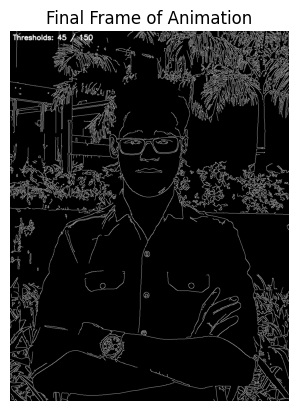

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imageio 
print("Loading image...")

building_path = '../assets/me.jpg' 
building_img = cv2.cvtColor(cv2.imread(building_path), cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(building_img, cv2.COLOR_RGB2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

frames = []
font = cv2.FONT_HERSHEY_SIMPLEX

print("Generating animation frames...")
for high_thresh in range(30, 151, 1): # Loop from 30 to 250, in steps of 4
    low_thresh = int(high_thresh * 0.3) # As recommended for Canny

    # Run the Canny detector with the current thresholds
    edges = cv2.Canny(blurred, low_thresh, high_thresh)
    
    frame = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
    
    # Add text to the frame showing the current thresholds
    text = f'Thresholds: {low_thresh} / {high_thresh}'
    cv2.putText(frame, text, (10, 30), font, 0.8, (255, 255, 255), 2, cv2.LINE_AA)
    
    # Add the completed frame to our list
    frames.append(frame)

print("Saving GIF... this may take a moment.")
imageio.mimsave('canny_edge_animation.gif', frames, fps=10)

print("\nDone! Look for 'canny_edge_animation.gif' in your folder.")

plt.imshow(frames[-1]) # Show the last frame (highest thresholds)
plt.title("Final Frame of Animation")
plt.axis('off')
plt.show()

### **2.2 The Power of Combining Blur and Canny**

A very common and effective pipeline is to **blur an image *before* running Canny**. The blur smooths out minor textures and noise, allowing the Canny algorithm to focus only on the more significant, structural edges.

Generated edges without pre-blurring.
Applied a 7x7 Gaussian Blur.
Generated edges *after* pre-blurring.


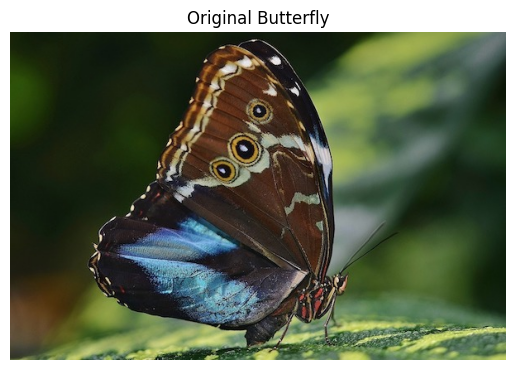

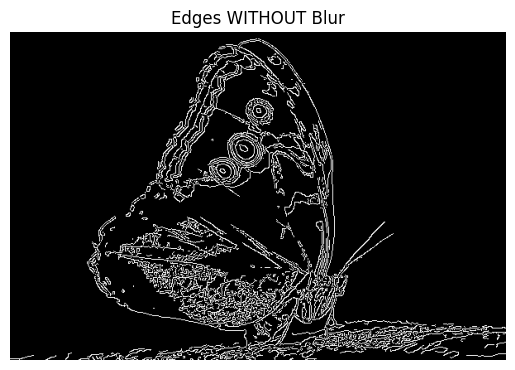

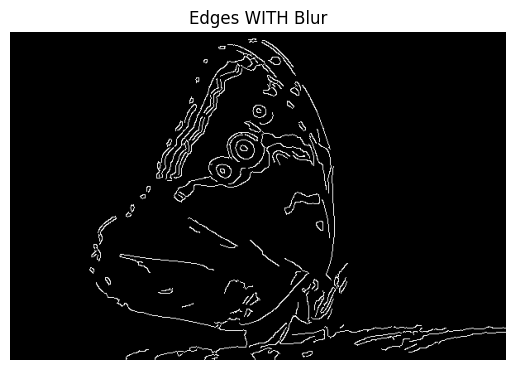

In [24]:
butterfly_path = '../assets/butterfly.jpg'
butterfly_img = cv2.imread(butterfly_path)
gray_butterfly = cv2.cvtColor(butterfly_img, cv2.COLOR_BGR2GRAY)

# Edges without blurring - lots of texture noise
edges_no_blur = cv2.Canny(gray_butterfly, 100, 200)
print("Generated edges without pre-blurring.")

# Blur the image first
blurred_butterfly = cv2.GaussianBlur(gray_butterfly, (7, 7), 0)
print("Applied a 7x7 Gaussian Blur.")

# Edges with blurring - much cleaner!
edges_with_blur = cv2.Canny(blurred_butterfly, 100, 200)
print("Generated edges *after* pre-blurring.")

# Display results
display_image("Original Butterfly", butterfly_img)
display_image("Edges WITHOUT Blur", edges_no_blur, is_bgr=False)
display_image("Edges WITH Blur", edges_with_blur, is_bgr=False)

### ⭐ You Try It! - Find the Edges

In the cell below, we've loaded a new image of a Coca-Cola logo. Your task is to apply the Canny edge detector to it. Do you think you need to apply a blur first? Why or why not? Experiment and see what gives you the cleanest result.

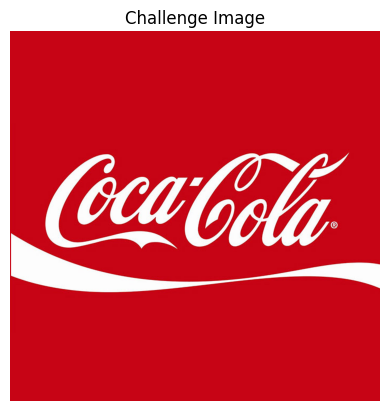

Processed the logo to find edges.


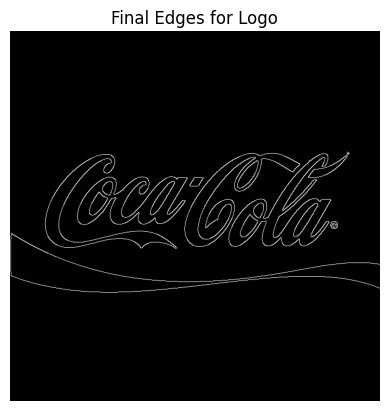

In [28]:
logo_path = '../assets/coca-cola-logo.png'
logo_img = cv2.imread(logo_path)

display_image("Challenge Image", logo_img)

# YOUR CODE HERE: Convert the logo to grayscale and apply Canny edge detection.
# Try it with and without a blur first. Which is better?
gray_logo = logo_img # Replace this line
final_edges = cv2.Canny(logo_img, 100, 200) # Replace this line

print("Processed the logo to find edges.")
display_image("Final Edges for Logo", final_edges, is_bgr=False)

<details>
<summary>Click here for the solution</summary>

```python
logo_path = 'assets/coca-cola-logo.png'
logo_img = cv2.imread(logo_path)

display_image("Challenge Image", logo_img)

# Convert the logo to grayscale
gray_logo = cv2.cvtColor(logo_img, cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection
# For a clean graphic image like this, blurring is generally not needed and can even soften the edges.
# The edges are already very sharp and there is no texture noise to remove.
final_edges = cv2.Canny(gray_logo, 50, 150)

print("Processed the logo to find edges.")
display_image("Final Edges for Logo", final_edges, is_bgr=False)
```
</details>

## **Conclusion**

Congratulations! You've now mastered two of the most fundamental operations in computer vision: **filtering** and **edge detection**.

We've learned:
1.  **Convolution** is a powerful technique where a **kernel** slides over an image to modify pixels based on their neighbors.
2.  We can use different kernels to achieve effects like **blurring** (averaging) and **sharpening** (accentuating differences).
3.  **Canny Edge Detection** is the standard algorithm for finding clean, structural edges in an image, and it works best when combined with a pre-processing blur to remove noise.

**In our next module,** we will see why even powerful algorithms like Canny have their limits, and we will set the stage for the modern deep learning approach to computer vision.

Loading image...
Generating animation frames...
Saving GIF... this may take a moment.

Done! Look for 'binary_threshold_animation.gif' in your folder.


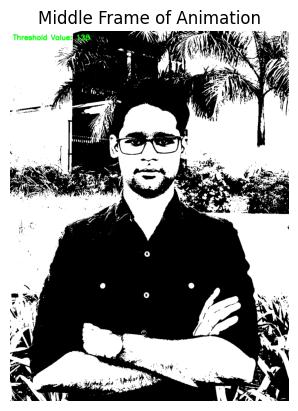

In [47]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imageio # For creating the GIF

print("Loading image...")
# --- 1. Load and Pre-process Image ---
building_path = '../assets/me.jpg' 
building_img = cv2.cvtColor(cv2.imread(building_path), cv2.COLOR_BGR2RGB)

# Binary thresholding is done on a grayscale image
gray = cv2.cvtColor(building_img, cv2.COLOR_RGB2GRAY)

# --- 2. Create Animation Frames ---
frames = []
font = cv2.FONT_HERSHEY_SIMPLEX

print("Generating animation frames...")
# We will loop the threshold value from 0 up to 255
for thresh_val in range(0, 256, 2): # Loop from 0 to 255, in steps of 4
    
    ret, thresh_img = cv2.threshold(gray, thresh_val, 255, cv2.THRESH_BINARY)
    
    frame = cv2.cvtColor(thresh_img, cv2.COLOR_GRAY2RGB)
    
    # Add text to the frame showing the current threshold
    text = f'Threshold Value: {thresh_val}'
    cv2.putText(frame, text, (10, 30), font, 0.8, (0, 255, 0), 2, cv2.LINE_AA)
    
    # Add the completed frame to our list
    frames.append(frame)

print("Saving GIF... this may take a moment.")
imageio.mimsave('binary_threshold_animation.gif', frames, fps=15)

print("\nDone! Look for 'binary_threshold_animation.gif' in your folder.")

# --- 4. Optional: Show a frame from the middle of the animation ---
middle_frame = frames[len(frames) // 2]
plt.imshow(middle_frame)
plt.title("Middle Frame of Animation")
plt.axis('off')
plt.show()